In [ ]:
import os
os.environ["KAGGLE_CONFIG_DIR"] = "/content/drive/MyDrive"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!kaggle datasets download -d emmarex/plantdisease

plantdisease.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip \*.zip && rm *.zip

Streaming output truncated to the last 5000 lines.
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08c033bd-fbc3-445a-88d1-1863070e52ce___YLCV_GCREC 2872.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08dd176c-e9d9-4746-92c3-fa8dc9074347___UF.GRC_YLCV_Lab 03057.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08f78a80-46f5-45a6-937c-4d05d61c08c2___UF.GRC_YLCV_Lab 01895.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0903aa95-6e8a-4abd-a003-126fcd9a5493___YLCV_GCREC 2806.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0911d416-d73d-4c2a-8e45-207a7ceb7c9a___YLCV_GCREC 2773.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/09188838-cc89-4925-94c5-d9563c4cb4bf___UF.GRC_YLCV_Lab 02974.JPG  
  inflating: plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0922e026-b563-438d-b9ed-74

In [ ]:
import numpy as np
import pickle
import cv2
import gc
from os import listdir
from sklearn.preprocessing import LabelBinarizer
import tensorflow as tf
from keras.models import Sequential
from keras.layers import BatchNormalization
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers.core import Activation, Flatten, Dropout, Dense
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow import keras
from keras.layers import LeakyReLU
import tensorflow as tf
from tensorflow.keras import activations
from tensorflow.keras.layers import Add, AveragePooling2D, ZeroPadding2D, Input
from tensorflow.keras.models import Model

In [ ]:
train_ds = keras.utils.image_dataset_from_directory(
    directory = '/content/PlantVillage',
    labels = 'inferred',
    label_mode = 'int',
    validation_split=0.2,
    subset="training",
    seed=4321,
    batch_size = 32,
    image_size = (224,224)
)

Found 20638 files belonging to 15 classes.
Using 16511 files for training.


In [ ]:
test_ds = keras.utils.image_dataset_from_directory(
    directory = '/content/PlantVillage',
    labels = 'inferred',
    label_mode = 'int',
    validation_split=0.2,
    subset="validation",
    seed=4321,
    batch_size = 32,
    image_size = (224,224)
)

Found 20638 files belonging to 15 classes.
Using 4127 files for validation.


In [ ]:
from keras.applications.vgg16 import VGG16

In [ ]:
#@title
vgg = VGG16(input_shape=[224,224] + [3], weights='imagenet', include_top=False)

# don't train existing weights
for layer in vgg.layers:
  layer.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
from keras.applications import ResNet152V2

In [ ]:
resnet = ResNet152V2(input_shape=[224,224] + [3], weights='imagenet', include_top=False)
for layer in vgg.layers:
  layer.trainable = False

234545216/234545216 [==============================] - 11s 0us/step


In [ ]:
x = Flatten()(resnet.output)
# x = Dense(1000, activation='relu')(x)
prediction = Dense(15, activation='softmax')(x)

# create a model object
pre_model1 = Model(inputs=resnet.input, outputs=prediction)

# view the structure of the model
pre_model1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
pre_model1.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [ ]:
history2 = pre_model1.fit(train_ds,epochs=5,validation_data=test_ds)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


516/516 [==============================] - 534s 816ms/step - loss: 0.9075 - acc: 0.7388 - val_loss: 1.2227 - val_acc: 0.7645
Epoch 2/5
516/516 [==============================] - 409s 792ms/step - loss: 0.3567 - acc: 0.8870 - val_loss: 1518.4614 - val_acc: 0.0720
Epoch 3/5
516/516 [==============================] - 406s 787ms/step - loss: 0.2610 - acc: 0.9175 - val_loss: 0.8971 - val_acc: 0.7742
Epoch 4/5
516/516 [==============================] - 402s 778ms/step - loss: 0.1632 - acc: 0.9482 - val_loss: 1.0143 - val_acc: 0.8595
Epoch 5/5
516/516 [==============================] - 403s 781ms/step - loss: 0.4291 - acc: 0.8923 - val_loss: 8.2567 - val_acc: 0.4204


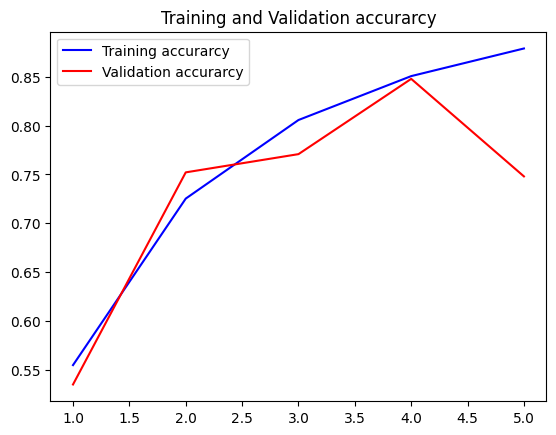

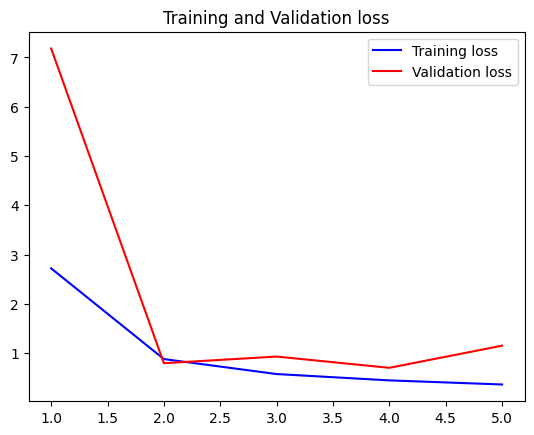

In [ ]:
acc = history2.history['acc']
val_acc = history2.history['val_acc']
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

In [ ]:
for image_batch, labels_batch in test_ds:
  X_test = image_batch.numpy()
  Y_test = labels_batch.numpy()
  break
Y_test

array([ 8,  9,  8,  0,  8, 12, 11,  1,  2,  1,  2, 11, 14,  0,  9,  0, 11,
       10,  8,  7, 12,  6, 13,  1,  1,  9,  3, 12,  8,  5,  5,  9],
      dtype=int32)

In [ ]:
y_pred = pre_model1.predict(X_test)
y_pred = tf.argmax(y_pred , 1)

1/1 [==============================] - 0s 40ms/step


In [ ]:
labels = ['Pepper__bell___Bacterial_spot',
 'Pepper__bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 #'Potato___healthy',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
    'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(Y_test, y_pred, target_names=labels))

                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       1.00      0.33      0.50         3
                     Pepper__bell___healthy       1.00      0.75      0.86         4
                      Potato___Early_blight       1.00      0.50      0.67         2
                       Potato___Late_blight       0.50      1.00      0.67         1
                           Potato___healthy       0.00      0.00      0.00         0
                      Tomato_Bacterial_spot       0.67      1.00      0.80         2
                        Tomato_Early_blight       0.00      0.00      0.00         1
                         Tomato_Late_blight       1.00      1.00      1.00         1
                           Tomato_Leaf_Mold       1.00      0.60      0.75         5
                  Tomato_Septoria_leaf_spot       0.44      1.00      0.62         4
Tomato_Spider_mites_Two_spotted_spider_mite       0.33      1.00

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

In [ ]:
from keras.applications import MobileNet

In [ ]:
mobile = MobileNet(input_shape=[224,224] + [3], weights='imagenet', include_top=False)
for layer in vgg.layers:
  layer.trainable = False

17225924/17225924 [==============================] - 0s 0us/step


In [ ]:
x = Flatten()(mobile.output)
# x = Dense(1000, activation='relu')(x)
prediction = Dense(15, activation='softmax')(x)

# create a model object
pre_model2 = Model(inputs=mobile.input, outputs=prediction)

# view the structure of the model
pre_model2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                                    

In [ ]:
pre_model2.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [ ]:
history3 = pre_model2.fit(train_ds,epochs=5,validation_data=test_ds)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


516/516 [==============================] - 96s 138ms/step - loss: 1.0499 - acc: 0.8641 - val_loss: 0.6553 - val_acc: 0.8699
Epoch 2/5
516/516 [==============================] - 66s 128ms/step - loss: 0.2359 - acc: 0.9408 - val_loss: 0.8531 - val_acc: 0.8835
Epoch 3/5
516/516 [==============================] - 66s 127ms/step - loss: 0.1569 - acc: 0.9615 - val_loss: 0.3060 - val_acc: 0.9283
Epoch 4/5
516/516 [==============================] - 70s 136ms/step - loss: 0.1567 - acc: 0.9618 - val_loss: 0.6220 - val_acc: 0.8798
Epoch 5/5
516/516 [==============================] - 67s 130ms/step - loss: 0.1069 - acc: 0.9712 - val_loss: 0.2643 - val_acc: 0.9448


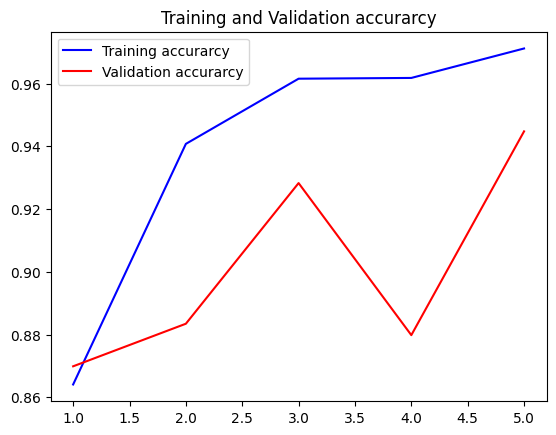

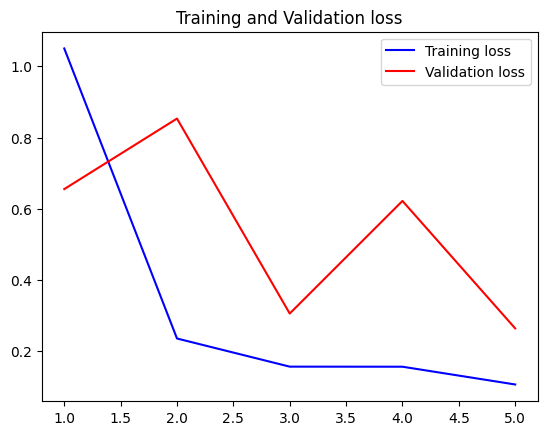

In [ ]:
acc = history3.history['acc']
val_acc = history3.history['val_acc']
loss = history3.history['loss']
val_loss = history3.history['val_loss']
epochs = range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

In [ ]:
y_pred1 = pre_model2.predict(X_test)
y_pred1 = tf.argmax(y_pred1 , 1)

1/1 [==============================] - 0s 428ms/step


In [ ]:
print(classification_report(Y_test, y_pred1, target_names=labels))

                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       1.00      0.67      0.80         3
                     Pepper__bell___healthy       1.00      1.00      1.00         4
                      Potato___Early_blight       1.00      1.00      1.00         2
                       Potato___Late_blight       1.00      1.00      1.00         1
                           Potato___healthy       1.00      1.00      1.00         2
                      Tomato_Bacterial_spot       1.00      1.00      1.00         1
                        Tomato_Early_blight       1.00      1.00      1.00         1
                         Tomato_Late_blight       1.00      1.00      1.00         5
                           Tomato_Leaf_Mold       1.00      1.00      1.00         4
                  Tomato_Septoria_leaf_spot       1.00      1.00      1.00         1
Tomato_Spider_mites_Two_spotted_spider_mite       0.75      1.00

In [ ]:
x = Flatten()(vgg.output)
# x = Dense(1000, activation='relu')(x)
prediction = Dense(15, activation='softmax')(x)

# create a model object
pre_model = Model(inputs=vgg.input, outputs=prediction)

# view the structure of the model
pre_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
pre_model.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [ ]:
def process(image,label):
    image = tf.cast(image/255. ,tf.float32)
    return image,label

train_ds = train_ds.map(process)
test_ds = test_ds.map(process)

In [ ]:
history1 = pre_model.fit(train_ds,epochs=5,validation_data=test_ds)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


516/516 [==============================] - 105s 178ms/step - loss: 0.6395 - acc: 0.8002 - val_loss: 0.4352 - val_acc: 0.8609
Epoch 2/5
516/516 [==============================] - 92s 178ms/step - loss: 0.2036 - acc: 0.9303 - val_loss: 0.2557 - val_acc: 0.9130
Epoch 3/5
516/516 [==============================] - 89s 171ms/step - loss: 0.1215 - acc: 0.9601 - val_loss: 0.2559 - val_acc: 0.9188
Epoch 4/5
516/516 [==============================] - 89s 171ms/step - loss: 0.0753 - acc: 0.9778 - val_loss: 0.2597 - val_acc: 0.9193
Epoch 5/5
516/516 [==============================] - 89s 172ms/step - loss: 0.0425 - acc: 0.9876 - val_loss: 0.2457 - val_acc: 0.9268


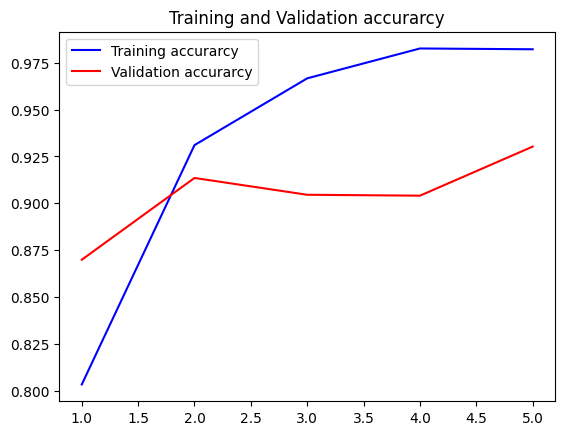

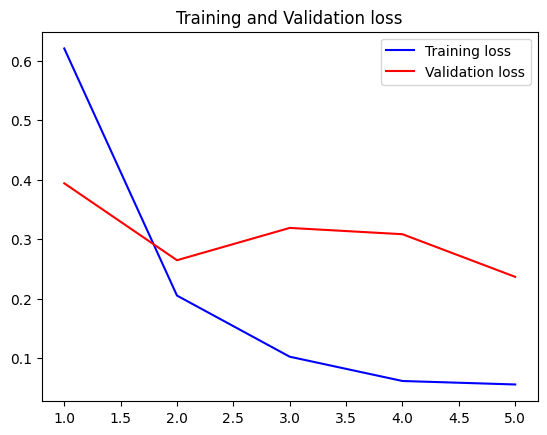

In [ ]:
acc = history1.history['acc']
val_acc = history1.history['val_acc']
loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs = range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

In [ ]:
y_pred2 = pre_model.predict(X_test)
y_pred2 = tf.argmax(y_pred2 , 1)

1/1 [==============================] - 0s 30ms/step


In [ ]:
y_pred2

<tf.Tensor: shape=(32,), dtype=int64, numpy=
array([ 8,  9,  8,  0,  8, 12, 11,  1,  2,  1,  2, 11, 14,  0,  9,  0, 11,
       10,  8,  7, 12,  6, 13,  1,  1,  9,  3, 12,  8,  5,  5,  9])>

In [ ]:
print(classification_report(Y_test, y_pred2, target_names=labels))

                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       1.00      1.00      1.00         3
                     Pepper__bell___healthy       1.00      1.00      1.00         4
                      Potato___Early_blight       1.00      1.00      1.00         2
                       Potato___Late_blight       1.00      1.00      1.00         1
                      Tomato_Bacterial_spot       1.00      1.00      1.00         2
                        Tomato_Early_blight       1.00      1.00      1.00         1
                         Tomato_Late_blight       1.00      1.00      1.00         1
                           Tomato_Leaf_Mold       1.00      1.00      1.00         5
                  Tomato_Septoria_leaf_spot       1.00      1.00      1.00         4
Tomato_Spider_mites_Two_spotted_spider_mite       1.00      1.00      1.00         1
                        Tomato__Target_Spot       1.00      1.00

In [ ]:
print("[INFO] Calculating model accuracy")
scores = pre_model.evaluate(test_ds)
print(f"Test Accuracy: {scores[1]*100}")

[INFO] Calculating model accuracy
129/129 [==============================] - 18s 139ms/step - loss: 0.2457 - acc: 0.9268
Test Accuracy: 92.6823377609253


In [ ]:
model = Sequential()
inputShape = (224, 224, 3)
chanDim = -1
if K.image_data_format() == "channels_first":
    inputShape = (3, 224, 224)
    chanDim = 1
model.add(Conv2D(32, (3, 3), padding="same",activation = "relu",input_shape=inputShape))
#model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), padding="same",activation = "relu"))
#model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(Conv2D(64, (3, 3), padding="same",activation = "relu"))
#model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, (3, 3), padding="same",activation = "relu"))
#model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(Conv2D(128, (3, 3), padding="same",activation = "relu"))
#model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(1024))
model.add(Activation("relu"))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(15))
model.add(Activation("softmax"))

In [ ]:
# def process(image,label):
#     image = tf.cast(image/255. ,tf.float32)
#     return image,label

# train_ds = train_ds.map(process)
# test_ds = test_ds.map(process)

In [ ]:
model.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [ ]:
history = model.fit(train_ds,epochs=10,validation_data=test_ds)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


516/516 [==============================] - 87s 131ms/step - loss: 0.9669 - acc: 0.7121 - val_loss: 8.9446 - val_acc: 0.2263
Epoch 2/10
516/516 [==============================] - 65s 124ms/step - loss: 0.4975 - acc: 0.8385 - val_loss: 1.8928 - val_acc: 0.5975
Epoch 3/10
516/516 [==============================] - 64s 124ms/step - loss: 0.3743 - acc: 0.8739 - val_loss: 0.8713 - val_acc: 0.7524
Epoch 4/10
516/516 [==============================] - 64s 124ms/step - loss: 0.3116 - acc: 0.8966 - val_loss: 0.3916 - val_acc: 0.8762
Epoch 5/10
516/516 [==============================] - 64s 124ms/step - loss: 0.3091 - acc: 0.8974 - val_loss: 0.3416 - val_acc: 0.8961
Epoch 6/10
516/516 [==============================] - 64s 124ms/step - loss: 0.2938 - acc: 0.9033 - val_loss: 0.8611 - val_acc: 0.7596
Epoch 7/10
516/516 [==============================] - 64s 124ms/step - loss: 0.1769 - acc: 0.9397 - val_loss: 0.5517 - val_acc: 0.8490
Epoch 8/10
516/516 [==============================] - 69s 134ms/st

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

In [ ]:
print("[INFO] Calculating model accuracy")
scores = model.evaluate(test_ds)
print(f"Test Accuracy: {scores[1]*100}")

In [ ]:
try:
    os.mkdir("/content/Sample_Data")
except:
    pass

In [ ]:
import random

In [ ]:
def select_random_images(num_images = 5):
    images = []
    disease_type = []
    disease_varities = os.listdir("/content/PlantVillage")
    for disease in disease_varities:
        for _ in range(num_images):
            disease_type.append(disease)

        imgs_path = random.choices(os.listdir("/content/PlantVillage/" + disease), k = num_images)
        for img_path in imgs_path:
            img = cv2.resize(cv2.imread("/content/PlantVillage/" + disease + "/" + img_path), [224,224])/255.0
            images.append(img)
    images = tf.cast(images, dtype = tf.float32)
    return images, disease_type

In [ ]:
images, actual_labels = select_random_images(num_images = 5)

In [ ]:
results = model.predict(images)

In [ ]:
pred_class = np.argmax(results, axis = -1)

In [ ]:
pred_class

In [ ]:
labels = ['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy',
 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy',
 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight',
 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite' ,'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']

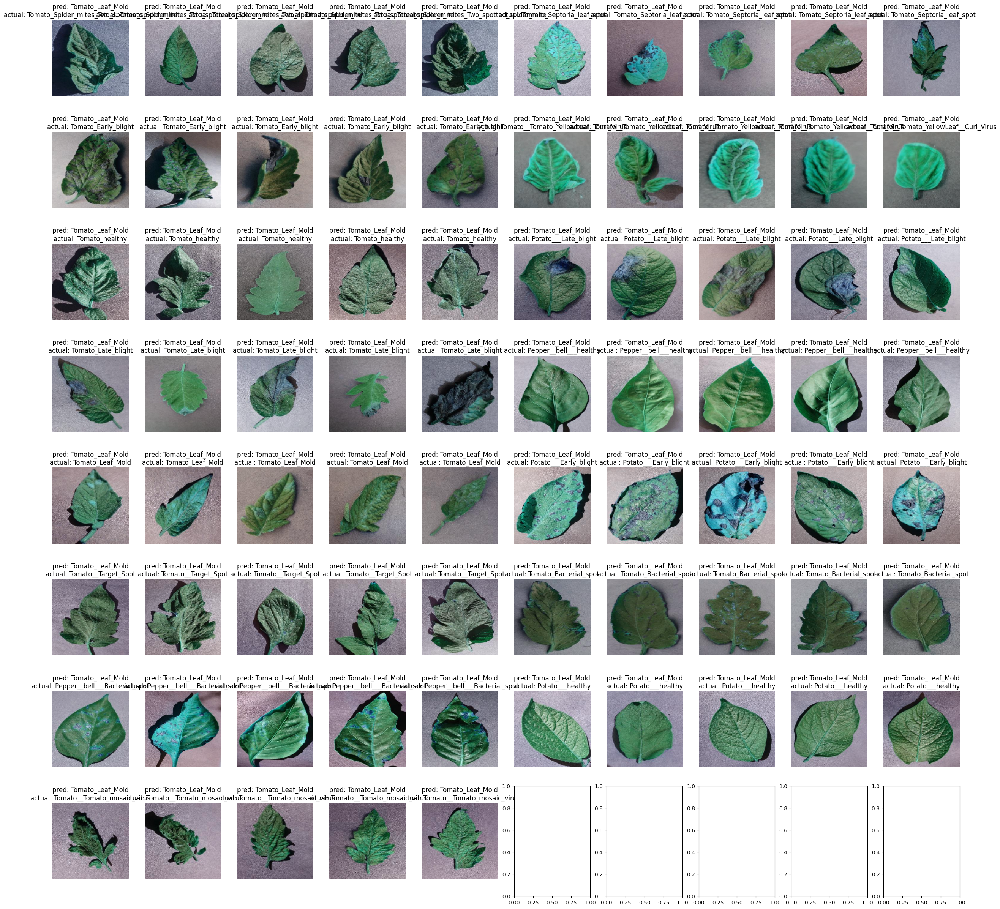

In [ ]:
rows = int(images.shape[0]**0.5)
cols = int(np.ceil(images.shape[0]/rows))
aspect = int(np.ceil(rows/cols))
fig, axe = plt.subplots(ncols=cols, nrows = rows, figsize = (24, 24//aspect))
for i in range(rows):
    for j in range(cols):
        s = i*cols + j
        if s < images.shape[0]:
            axe[i,j].imshow(images[s])
            axe[i,j].axis("off")
            axe[i,j].set_title("pred: " + str(labels[pred_class[s]]) +"\n"+ "actual: " + actual_labels[s])


plt.tight_layout(pad = 0.0, h_pad = 0.0, w_pad = 0.0)
plt.show()

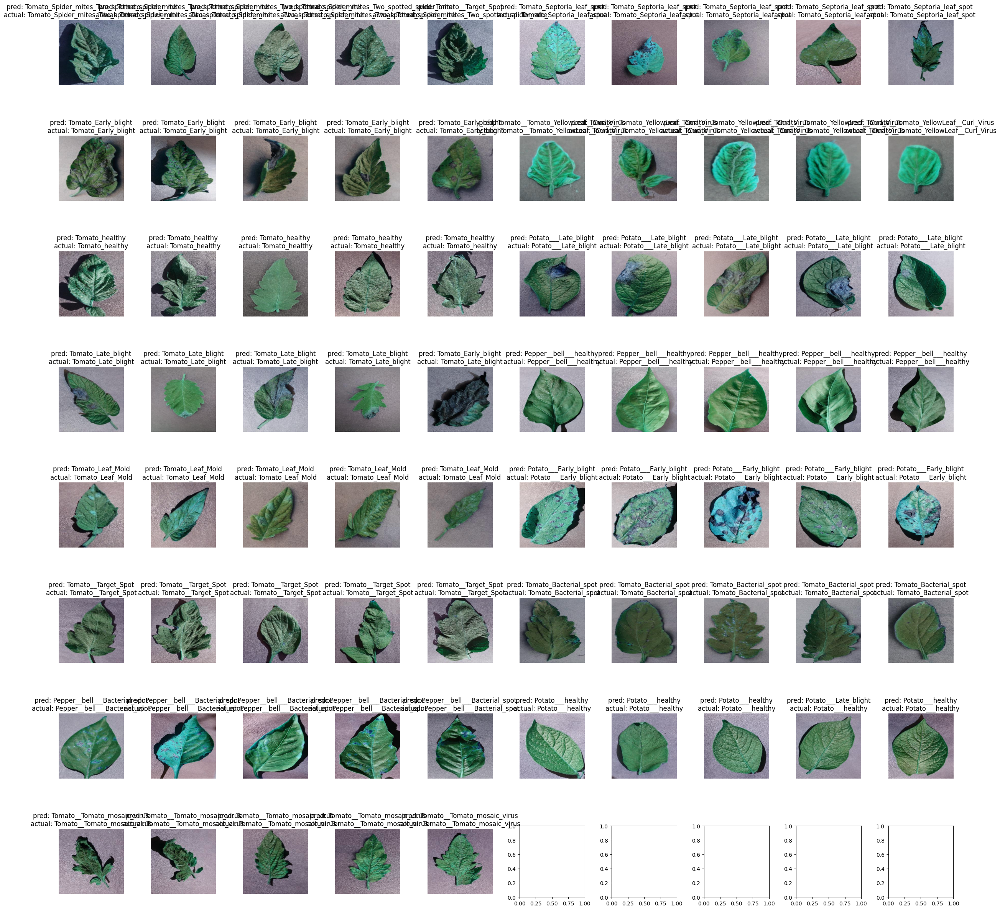